# Iterative Soundbite on NYC Property Sales Dataset
**To maximize ROI, purchase property in Manhattan built before 1940 or after 2000 that is 4,700+ gross square feet around $990K (median) in price.  *By the end of this analysis we will have identified 1-5 top actual properties*.**

* **Purpose:** Maximize ROI per property investment.
* **Criteria for success:** Identify 1-5 prime properties to invest in.
* **Scope:** Explore and Analyze the relationship between NYC Property: Price, Age, Square Footage, and Neighborhood .
* **Constraints:** data must be cleaned and visualized appropriately to map appropriately relevant statistics and business solutions. 
* **Key data sources:** Kaggle NYC Property Sales
https://www.kaggle.com/new-york-city/nyc-property-sales?fbclid=IwAR2_KPGJOLJGscrpy9IumrFMZPoeVLE2M__W3T2UVsiAV5rqBSdROK-KrKU

In [3]:
import numpy as np
import pandas as pd
import os
import warnings
warnings.filterwarnings("ignore")
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set()

import random
import operator

In [11]:
from datetime import date
from scipy.stats import skew 
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff


In [4]:
df = pd.read_csv('nyc-rolling-sales.csv')

In [5]:
df

,Unnamed: 0,BOROUGH,NEIGHBORHOOD,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BLOCK,LOT,EASE-MENT,BUILDING CLASS AT PRESENT,ADDRESS,...,RESIDENTIAL UNITS,COMMERCIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE PRICE,SALE DATE
0,4,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2A,392,6,,C2,153 AVENUE B,...,5,0,5,1633,6440,1900,2,C2,6625000,2017-07-19 00:00:00
1,5,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,399,26,,C7,234 EAST 4TH STREET,...,28,3,31,4616,18690,1900,2,C7,-,2016-12-14 00:00:00
2,6,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,399,39,,C7,197 EAST 3RD STREET,...,16,1,17,2212,7803,1900,2,C7,-,2016-12-09 00:00:00
3,7,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2B,402,21,,C4,154 EAST 7TH STREET,...,10,0,10,2272,6794,1913,2,C4,3936272,2016-09-23 00:00:00
4,8,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2A,404,55,,C2,301 EAST 10TH STREET,...,6,0,6,2369,4615,1900,2,C2,8000000,2016-11-17 00:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84543,8409,5,WOODROW,02 TWO FAMILY DWELLINGS,1,7349,34,,B9,37 QUAIL LANE,...,2,0,2,2400,2575,1998,1,B9,450000,2016-11-28 00:00:00
84544,8410,5,WOODROW,02 TWO FAMILY DWELLINGS,1,7349,78,,B9,32 PHEASANT LANE,...,2,0,2,2498,2377,1998,1,B9,550000,2017-04-21 00:00:00
84545,8411,5,WOODROW,02 TWO FAMILY DWELLINGS,1,7351,60,,B2,49 PITNEY AVENUE,...,2,0,2,4000,1496,1925,1,B2,460000,2017-07-05 00:00:00
84546,8412,5,WOODROW,22 STORE BUILDINGS,4,7100,28,,K6,2730 ARTHUR KILL ROAD,...,0,7,7,208033,64117,2001,4,K6,11693337,2016-12-21 00:00:00


In [12]:
df.shape

(84548, 22)

In [13]:
#setting df_raw in case we need to revist the raw data frame b4 alterations
df_raw = df

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84548 entries, 0 to 84547
Data columns (total 22 columns):
 #   Column                          Non-Null Count  Dtype 
---  ------                          --------------  ----- 
 0   Unnamed: 0                      84548 non-null  int64 
 1   BOROUGH                         84548 non-null  int64 
 2   NEIGHBORHOOD                    84548 non-null  object
 3   BUILDING CLASS CATEGORY         84548 non-null  object
 4   TAX CLASS AT PRESENT            84548 non-null  object
 5   BLOCK                           84548 non-null  int64 
 6   LOT                             84548 non-null  int64 
 7   EASE-MENT                       84548 non-null  object
 8   BUILDING CLASS AT PRESENT       84548 non-null  object
 9   ADDRESS                         84548 non-null  object
 10  APARTMENT NUMBER                84548 non-null  object
 11  ZIP CODE                        84548 non-null  int64 
 12  RESIDENTIAL UNITS               84548 non-null

In [15]:
# count the number of missing values. 
#...how much data cleaning do we need to do...
df.isna().sum()

Unnamed: 0                        0
BOROUGH                           0
NEIGHBORHOOD                      0
BUILDING CLASS CATEGORY           0
TAX CLASS AT PRESENT              0
BLOCK                             0
LOT                               0
EASE-MENT                         0
BUILDING CLASS AT PRESENT         0
ADDRESS                           0
APARTMENT NUMBER                  0
ZIP CODE                          0
RESIDENTIAL UNITS                 0
COMMERCIAL UNITS                  0
TOTAL UNITS                       0
LAND SQUARE FEET                  0
GROSS SQUARE FEET                 0
YEAR BUILT                        0
TAX CLASS AT TIME OF SALE         0
BUILDING CLASS AT TIME OF SALE    0
SALE PRICE                        0
SALE DATE                         0
dtype: int64

In [ ]:
# according to the data definition of terms
## we will remove Ease-ment AND
# the Unnamed : 0 column does not contain any useful information, so it will be removed
## REFERENCE NYC property sales EDA - Map analysis line 4

According to the [New York department of Finance](https://www1.nyc.gov/assets/finance/downloads/pdf/07pdf/glossary_rsf071607.pdf), Ease-ment is "is a right, such as a right of way, which allows an entity to make limited use of another’s real property. For example: MTA railroad tracks that run across a portion of another property". Also, the Unnamed column is not mentioned and was likely used for iterating through records. So, those two columns are removed for now.

In [16]:
df.drop(['Unnamed: 0', 'EASE-MENT'],1, inplace=True)

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84548 entries, 0 to 84547
Data columns (total 20 columns):
 #   Column                          Non-Null Count  Dtype 
---  ------                          --------------  ----- 
 0   BOROUGH                         84548 non-null  int64 
 1   NEIGHBORHOOD                    84548 non-null  object
 2   BUILDING CLASS CATEGORY         84548 non-null  object
 3   TAX CLASS AT PRESENT            84548 non-null  object
 4   BLOCK                           84548 non-null  int64 
 5   LOT                             84548 non-null  int64 
 6   BUILDING CLASS AT PRESENT       84548 non-null  object
 7   ADDRESS                         84548 non-null  object
 8   APARTMENT NUMBER                84548 non-null  object
 9   ZIP CODE                        84548 non-null  int64 
 10  RESIDENTIAL UNITS               84548 non-null  int64 
 11  COMMERCIAL UNITS                84548 non-null  int64 
 12  TOTAL UNITS                     84548 non-null

In [18]:
# try to check number of missing values now...
df.isna().sum()

BOROUGH                           0
NEIGHBORHOOD                      0
BUILDING CLASS CATEGORY           0
TAX CLASS AT PRESENT              0
BLOCK                             0
LOT                               0
BUILDING CLASS AT PRESENT         0
ADDRESS                           0
APARTMENT NUMBER                  0
ZIP CODE                          0
RESIDENTIAL UNITS                 0
COMMERCIAL UNITS                  0
TOTAL UNITS                       0
LAND SQUARE FEET                  0
GROSS SQUARE FEET                 0
YEAR BUILT                        0
TAX CLASS AT TIME OF SALE         0
BUILDING CLASS AT TIME OF SALE    0
SALE PRICE                        0
SALE DATE                         0
dtype: int64

It looks like empty records are not being treated as NA (missing) values in the existing default parameters. We will have to convert columns into appropriately relevant data types to count for missing values. We can make some enhancements to the data time feilds in the process for preforming any future time series analysis.

In [19]:
# check ALL unique values
for col in df.columns:
    print(col, df[col].nunique())
    


BOROUGH 5
NEIGHBORHOOD 254
BUILDING CLASS CATEGORY 47
TAX CLASS AT PRESENT 11
BLOCK 11566
LOT 2627
BUILDING CLASS AT PRESENT 167
ADDRESS 67563
APARTMENT NUMBER 3989
ZIP CODE 186
RESIDENTIAL UNITS 176
COMMERCIAL UNITS 55
TOTAL UNITS 192
LAND SQUARE FEET 6062
GROSS SQUARE FEET 5691
YEAR BUILT 158
TAX CLASS AT TIME OF SALE 4
BUILDING CLASS AT TIME OF SALE 166
SALE PRICE 10008
SALE DATE 364


In [20]:
#again check the data types
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84548 entries, 0 to 84547
Data columns (total 20 columns):
 #   Column                          Non-Null Count  Dtype 
---  ------                          --------------  ----- 
 0   BOROUGH                         84548 non-null  int64 
 1   NEIGHBORHOOD                    84548 non-null  object
 2   BUILDING CLASS CATEGORY         84548 non-null  object
 3   TAX CLASS AT PRESENT            84548 non-null  object
 4   BLOCK                           84548 non-null  int64 
 5   LOT                             84548 non-null  int64 
 6   BUILDING CLASS AT PRESENT       84548 non-null  object
 7   ADDRESS                         84548 non-null  object
 8   APARTMENT NUMBER                84548 non-null  object
 9   ZIP CODE                        84548 non-null  int64 
 10  RESIDENTIAL UNITS               84548 non-null  int64 
 11  COMMERCIAL UNITS                84548 non-null  int64 
 12  TOTAL UNITS                     84548 non-null

## Transforming Data to Preform Numerical Analysis 
We are going to convert LAND SQUARE FEET, GROSS SQUARE FEET, SALE PRICE, AND BOROUGH into numeric. Pandas unpacked them out of the box as objects. We want the numeric data type so we can use approriate data tools.

SALE DATE will become datetime format. This is to preform any future time series analysis. 

The following will be made into categorical data: NEIGHBORHOOD, BUILDING CLASS CATEGORY, TAX CLASS AT PRESENT, BUILDING CLASS AT PRESENT, BUILDING CLASS AT TIME OF SALE, TAX CLASS AT TIME OF SALE. *more information on the Pandas categorical data type can be found here:*[Practical Business Python, Using the Pandas Category Data Type](https://pbpython.com/pandas_dtypes_cat.html#:~:text=The%20category%20data%20type%20in%20pandas%20is%20a,why%20do%20we%20care%20about%20using%20categorical%20values%3F)


In [21]:
numeric = ['LAND SQUARE FEET', 'GROSS SQUARE FEET', 'SALE PRICE', 'BOROUGH']
for col in numeric: # coerce for missing values
    df[col] = pd.to_numeric(df[col], errors='coerce')
    
categorical = ['NEIGHBORHOOD', 'BUILDING CLASS CATEGORY', 'TAX CLASS AT PRESENT','BUILDING CLASS AT PRESENT','BUILDING CLASS AT TIME OF SALE','TAX CLASS AT TIME OF SALE']
for col in categorical:
    df[col] = df[col].astype('category')
    
df['SALE DATE']= pd.to_datetime(df['SALE DATE'], errors='coerce')

Our dataset (df) should now be ready to check for missing numeric values in the areas we want to preform analysis on. let's see...

In [22]:
df.isna().sum()

BOROUGH                               0
NEIGHBORHOOD                          0
BUILDING CLASS CATEGORY               0
TAX CLASS AT PRESENT                  0
BLOCK                                 0
LOT                                   0
BUILDING CLASS AT PRESENT             0
ADDRESS                               0
APARTMENT NUMBER                      0
ZIP CODE                              0
RESIDENTIAL UNITS                     0
COMMERCIAL UNITS                      0
TOTAL UNITS                           0
LAND SQUARE FEET                  26252
GROSS SQUARE FEET                 27612
YEAR BUILT                            0
TAX CLASS AT TIME OF SALE             0
BUILDING CLASS AT TIME OF SALE        0
SALE PRICE                        14561
SALE DATE                             0
dtype: int64

We can see the number of missing values. Now let's visualize this as a percent of total using Pandas.

In [23]:
missing = df.isnull().sum()/len(df)*100

#if missing values exist, print the number and % it represents of its total
print(pd.DataFrame([missing[missing>0],pd.Series(df.isnull().sum()[df.isnull().sum()>1000])], index=['percent missing','total missing']))

                 LAND SQUARE FEET  GROSS SQUARE FEET   SALE PRICE
percent missing         31.049818          32.658372     17.22217
total missing        26252.000000       27612.000000  14561.00000


Around 30% of GROSS SF and LAND SF are missing. Furthermore, around 17% of SALE PRICE is also missing. The below graph indicates which parts of the table are missing values in yellow.

<AxesSubplot:>

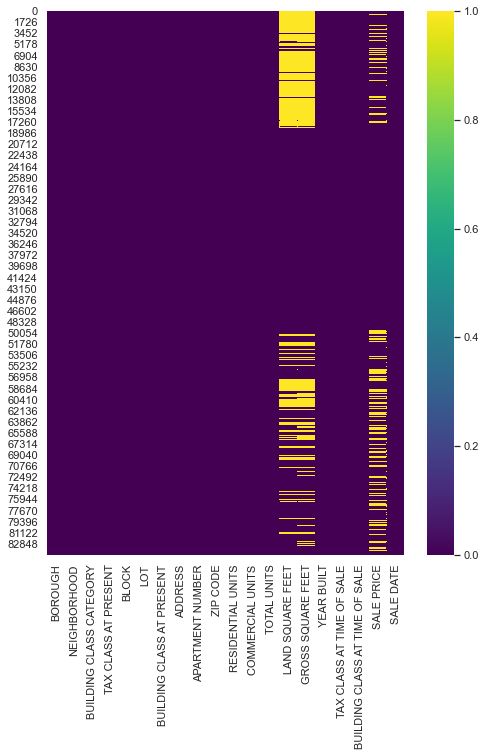

In [24]:
plt.figure(figsize=(8,10))
sns.heatmap(df.isnull(),cmap='viridis')

We can see our missing values in YELLOW.

are there duplicate rows?

In [25]:
sum(df.duplicated(df.columns))

765

lets drop the duplicates and run the heatmap again

In [26]:
df = df.drop_duplicates(df.columns,keep='last')
sum(df.duplicated(df.columns))

0

we dropped 765 duplicates, and now there are zero duplicates.
let's run the heatmap again and see what happened...

<AxesSubplot:>

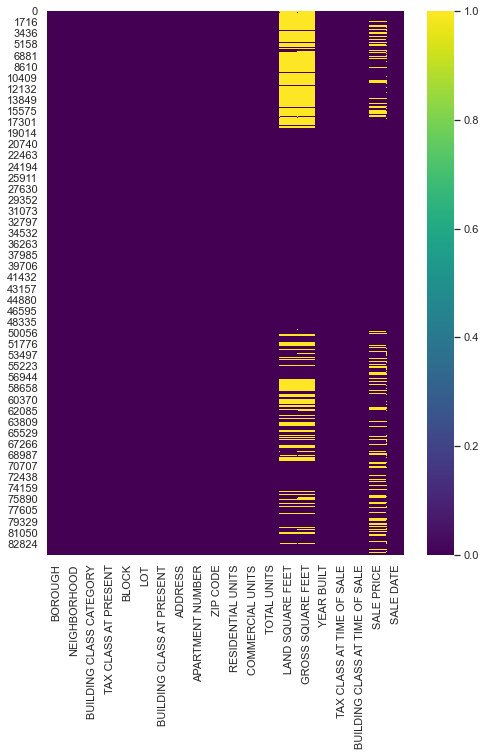

In [97]:
plt.figure(figsize=(8,10))
sns.heatmap(df.isnull(),cmap='viridis')

No significant changes but we have cleaned our data of duplicates. Now let’s set the bouough names , get rid of the rows with missing [price values], and preform exploratory analysis to observe price coorleations…I have not decided what to do with the Gross Square Footage /Land Square Footage missing values yet.

In [27]:
#set the Borough names
df['BOROUGH'][df['BOROUGH'] == 1] = 'Manhattan'
df['BOROUGH'][df['BOROUGH'] == 2] = 'Bronx'
df['BOROUGH'][df['BOROUGH'] == 3] = 'Brooklyn'
df['BOROUGH'][df['BOROUGH'] == 4] = 'Queens'
df['BOROUGH'][df['BOROUGH'] == 5] = 'Staten Island'

In [28]:
#remove the rows with missing SALE PRICE
df = df[df['SALE PRICE'].notnull()]
#count how many rows we have left
len(df)

69607

After removing the missing values in SALE PRICE we are left with 70k observations, down from 85k at the very start.

Now, let's start building visulaizations to see what we can do with the pricing data.  


In [29]:
# overview of general descriptive statistics on the cleaned data
df.describe()

,BLOCK,LOT,ZIP CODE,RESIDENTIAL UNITS,COMMERCIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,SALE PRICE
count,69607.000000,69607.000000,69607.000000,69607.000000,69607.000000,69607.000000,4.844900e+04,4.790000e+04,69607.000000,6.960700e+04
mean,4199.890140,374.580473,10741.159323,1.875070,0.164121,2.059319,3.544802e+03,3.528707e+03,1799.852184,1.280703e+06
std,3431.897518,656.232024,1264.804508,14.291398,8.997236,16.992716,3.973875e+04,2.920564e+04,520.099311,1.143036e+07
min,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000e+00
25%,1350.000000,22.000000,10306.000000,0.000000,0.000000,0.000000,1.425000e+03,8.160000e+02,1920.000000,2.300000e+05
50%,3378.000000,50.000000,11209.000000,1.000000,0.000000,1.000000,2.150000e+03,1.620000e+03,1938.000000,5.330000e+05
75%,6192.000000,820.000000,11249.000000,2.000000,0.000000,2.000000,3.100000e+03,2.508000e+03,1965.000000,9.500000e+05
max,16319.000000,9106.000000,11694.000000,1844.000000,2261.000000,2261.000000,4.252327e+06,3.750565e+06,2017.000000,2.210000e+09


In the dataset we have SALE PRICE with 0 as value and some very small numbers, which are cases of transfers of deeds between parties: for example, parents transferring ownership to their home to a child after moving out for retirement. according to the below kernel there are also outliers that in the above 3 columns which can be easily seen in the scatter plots so, we select a range for the values in these columns and remove all the other rows.

Reference : https://www.kaggle.com/akosciansky/how-to-become-a-property-tycoon-in-new-york

In [30]:
#making a second copy of the raw dataframe in case we make any changes to df_raw
# this contains cleaned data frame with no missing sales price values
# it contains values below $100k and above $5M
df_raw2 = df

In [31]:
len(df_raw2)

69607

## Prime Stage
Cleaning Sales price from 100k (low) to 5M (high)

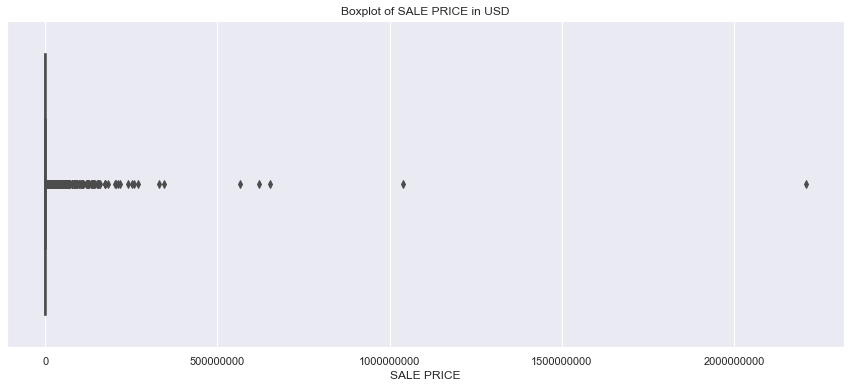

In [32]:
#Set the size of the plot
plt.figure(figsize=(15,6))

# Plot the data and configure the settings
sns.boxplot(x='SALE PRICE', data=df_raw2)
plt.ticklabel_format(style='plain', axis='x')
plt.title('Boxplot of SALE PRICE in USD')
plt.show()

You can see the outliers above, one at 2B, one at 1B, three above 500M.

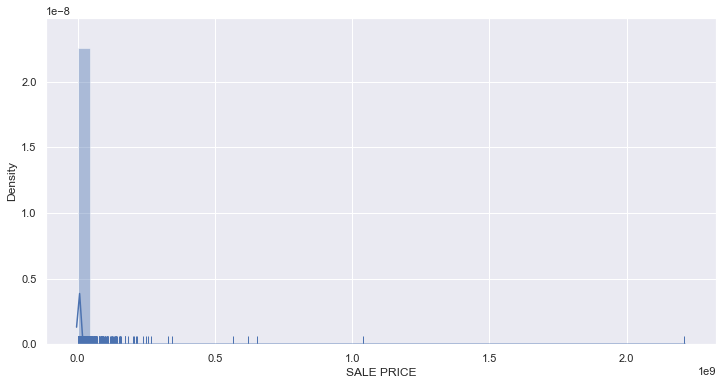

In [33]:
plt.figure(figsize=(12,6))
sns.distplot(df_raw2['SALE PRICE'], kde=True, bins=50, rug=True)
plt.show()

We really need to view a closer observation of the 'peak' of the mountain around 0.0, so let's make a cut off at 5M (reference) to see the observations where the majority of the data exists, excluding the outliers...

## 100k - 5M visualized in clarity. 
 also unusually high number of 0-100k values, representing generational transfers of wealth, gifts, etc.


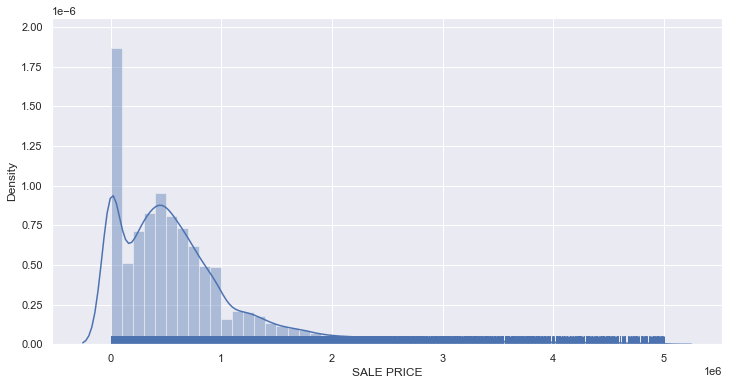

In [34]:

df5m= df_raw2[(df_raw2['SALE PRICE']<5000000)]
plt.figure(figsize=(12,6))
sns.distplot(df5m['SALE PRICE'], kde=True, bins=50, rug=True)
plt.show()

okay perfect, that is what we needed to see...we see a large number of propertie sales between 0 and 100k...at this point we can understand why the kaggle documenation on this data set it mentioned "many sales occur with a nonsensically small dollar amount..." reference: [NYC Property Sales](https://www.kaggle.com/new-york-city/nyc-property-sales?fbclid=IwAR0EiMVRtLrP2zp6bNfq9eZhqE2jKcZ_ui4moBdvELt0G8ImLdUk31NBSSo), which are cases or transfers of deeds between parties: for example, parents transferring ownership to their home to a child after moving out for retirement, and accordingly...thus, according to the histogram above I feel confident about the cut off mininmum of 100k...anything under 100k in NYC we will consider an outlier...we will clean the data approprieately... 

I created df5m as all data under 5M in price.
I also want to visualize:
* Data over $5M & Data over $500M
* Data between 0 - $200k
this will give me greater confidence in what points I am cleaning this dataset at
we'll use df_raw2 for this...

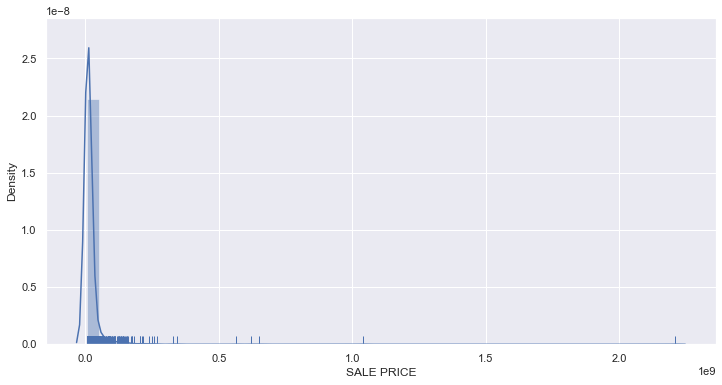

In [35]:
#show me the data over $5M
df_over_5m = df_raw2[(df_raw2['SALE PRICE']>5000000)]
plt.figure(figsize=(12,6))
sns.distplot(df_over_5m['SALE PRICE'], kde=True, bins=50, rug=True)
plt.show()

In [36]:
# 2324 transactions over 5M
len(df_over_5m)

2324

In [37]:
len(df_raw2)

69607

In [38]:
len(df5m)

67241

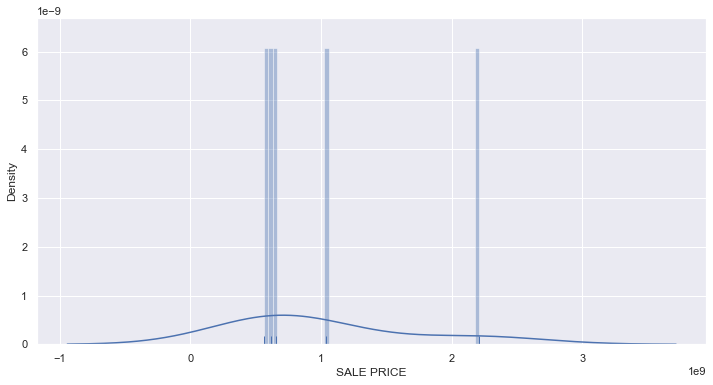

In [39]:
#show me the data over $500M
df_over_5HM = df_raw2[(df_raw2['SALE PRICE']>500000000)]
plt.figure(figsize=(12,6))
sns.distplot(df_over_5HM['SALE PRICE'], kde=True, bins=50, rug=True)
plt.show()

the observation shows five total transactions over 500M

In [40]:
#correct. we can veiw these 5 large transactions in Tableua later....right now I don't want them to skew my data
len(df_over_5HM)

5

if desirable, we can veiw these 5 large NYC transactions above 500M in Tableua later....right now I do not want them to skew my data analysis...

I also feel comfortable removing the 2324 transactions over 5M. we could preform analysis on these as 'stand alone above 5M' later.... however, transactions over 5M represent only 3.33% of this data set. I want to remove them so they do not skew the data.... anything sold over 5M is considered a 'different animal' at this juncture...

In [ ]:
#show me the data between 0 - $200k

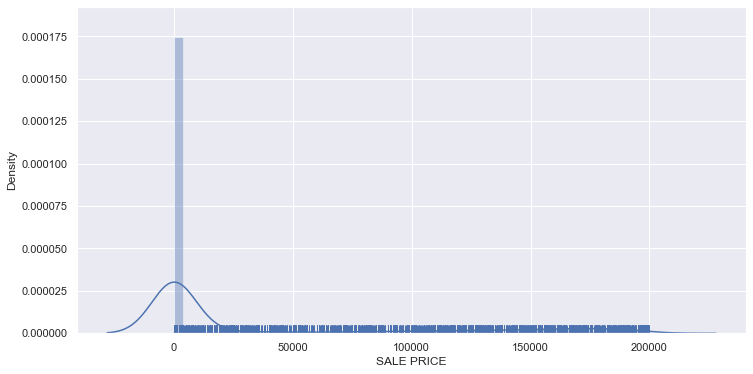

In [41]:
df_less_200k = df_raw2[(df_raw2['SALE PRICE']<200000)]
plt.figure(figsize=(12,6))
sns.distplot(df_less_200k['SALE PRICE'], kde=True, bins=50, rug=True)
plt.show()

In [42]:
len(df_less_200k)

16003

interesting, that's 16k values....that's a lot...let's observe under 100k...

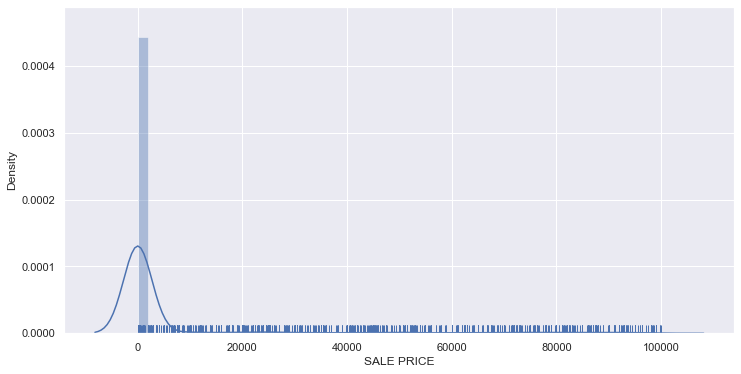

In [43]:
df_less_100k = df_raw2[(df_raw2['SALE PRICE']<100000)]
plt.figure(figsize=(12,6))
sns.distplot(df_less_100k['SALE PRICE'], kde=True, bins=50, rug=True)
plt.show()

In [44]:
len(df_less_100k)

12560

In [1]:
# import plotly.offline as py

..at this point I want to use Plotly to drill in on what's happening here....I want to see how many are 0 values...how many are 1 to 100k....

....let's view the 0 - 200k data in plotly...that's what it's for, cleaning data...right?

In [45]:
from scipy.stats import skew 
trace1 = go.Histogram(
    x = df_less_200k['SALE PRICE'],
    name = 'SALE PRICE'
)
dat = [trace1]
# Plot!
#py.iplot(dat, filename='Distplot with Normal Curve')

print("Skewness of Sale Price attribute is : {0}".format(skew(df['SALE PRICE'])))

trace2 = go.Histogram(
    x = np.log(df_less_200k['SALE PRICE']), 
    name = 'log(SALE PRICE)'
)
dat = [trace1]
# Plot!
#py.iplot(dat, filename='Distplot with Normal Curve')
print("Skewness of Sale Price attribute after applying log is : {0}".format(skew(np.log(df['SALE PRICE']))))

fig = tls.make_subplots(rows=2, cols=1, subplot_titles=('Sale Prices', 'Sale Prices after applying log'));
fig.append_trace(trace1, 1, 1);
fig.append_trace(trace2, 2, 1);
fig['layout'].update(height=600, width=800,title='Histogram Plot for Sale Prices of Properties');
py.iplot(fig, filename='simple-subplot')


Skewness of Sale Price attribute is : 123.94046090154832
Skewness of Sale Price attribute after applying log is : nan


Extremely helpful insight here...11k transactions from 0 to 5k. this is likely where the majority of transfer of deeds comes from...the small number of sales transpiring between 5k - 100k seem to be in a transfer alluded to in the kaggle documentation...anything under 100k seems to be too cheap. removing transactions under 100k seems to be approriate at this point.looking at the log chart you can see the number of occurances under 100k are very few. 

let's now look at sales prices over 5M in Plotly. remember sales over 5M are only 2324 transactions, which represent 3.33% of the data set...

In [46]:
# 2324 transactions over 5M
len(df_over_5m)

2324

SHOW DAVID WHAT'S HAPPENING IN PLOTLY

In [47]:
trace1 = go.Histogram(
    x = df_over_5m['SALE PRICE'],
    name = 'SALE PRICE'
)
dat = [trace1]
# Plot!
#py.iplot(dat, filename='Distplot with Normal Curve')

print("Skewness of Sale Price attribute is : {0}".format(skew(df['SALE PRICE'])))

trace2 = go.Histogram(
    x = np.log(df_over_5m['SALE PRICE']), 
    name = 'log(SALE PRICE)'
)
dat = [trace1]
# Plot!
#py.iplot(dat, filename='Distplot with Normal Curve')
print("Skewness of Sale Price attribute after applying log is : {0}".format(skew(np.log(df['SALE PRICE']))))

fig = tls.make_subplots(rows=2, cols=1, subplot_titles=('Sale Prices', 'Sale Prices after applying log'));
fig.append_trace(trace1, 1, 1);
fig.append_trace(trace2, 2, 1);
fig['layout'].update(height=600, width=800,title='Histogram Plot for Sale Prices of Properties');
py.iplot(fig, filename='simple-subplot')


Skewness of Sale Price attribute is : 123.94046090154832
Skewness of Sale Price attribute after applying log is : nan


...there are some larger transactions in this dataset above 5M...2,324 in total representing 3.33% of the data...
* there are 1360 between 5M - 10M
* there are 603 between 10M - 20M
* there are 149 between 20M - 30M
* there are 59 between 30M - 40M
* there are 31 between 40M - 50M
* there are 25 between 50M - 60M
* there are 21 between 60M - 70M
* there are 12 between 70M - 80M
* there are 10 between 80M - 90M
* there are 10 between 90M - 100M
* ...use Tableau to observe further....
* you have 5 'whale' transactions above 500M
* one transaction above 1Billion
* one transaction above 2Billion

It could be approriate to view these transactions in a seperate analysis project section in Tableau. However for preforming statistical analysis in this project, I feel comfortable removing the 3.33% of the data set containing transactions over 5M to focus statistical efforts on where the majority of the data exists.

After the above analysis, the decision was made to preform further statistical analysic after removing sales price below 100k (low) and above 5M (high)

# Transactions below 100k and above 5M

What we see from the graphs above is that there are outliers. There are not only outliers, but we have some high leverage outliers...five transactions above 500M. We also have one transaction over 1Billion and one transaction over 2B property. Maybe this isn't all that surprising given that Manhattan is home to a lot of very expensive property. Perhaps this is a lump sum purchase of an entire building...but we should not assume...We also see 11k transactions between 0 to 5k, and very few transactions between 5k - 100k. The kaggle documenation mentions "many sales occur with a nonsensically small dollar amount..." reference: NYC Property Sales, which are cases or transfers of deeds between parties. We are going to rely on this as evidence to remove anything under 100k. We could drill in on specifics within these ranges in Tableau, but for the purposes of this project we will remove anything under 100k.


There are 2,324 transactions over 5M , representing only 3.33% of the data set. we could also drill on specifics within these ranges in Tableau, but for the purposes of this project we will remove anything 5M. 

Property transactions below 100k and above 5M are a different animal, and mixing all together in one model will decrease accuracy for the purposes of this project.

In [48]:
df = df[(df['SALE PRICE'] > 100000) & (df['SALE PRICE'] < 5000000)]
len(df)

54579

In [ ]:

#in line from reference 54579 

let's look at the available data that we have now, in another way 

In [49]:
# Capture the necessary data
variables = df.columns

count = []

for variable in variables:
    length = df[variable].count()
    count.append(length)
    
count_pct = np.round(100 * pd.Series(count) / len(df), 2)

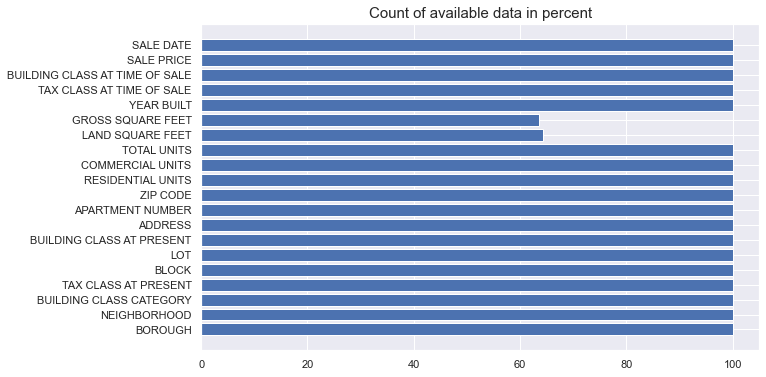

In [50]:
#Plot number of available data per variable
plt.figure(figsize=(10,6))
plt.barh(variables, count_pct)
plt.title('Count of available data in percent', fontsize=15)
plt.show()

before removing any of the rows associated to Gross Sq Feet and Land Square Feet, I want to observe the price based on the buildings age...that is, what is the coorelation between the sale price and year built. NYC is one of the oldest cities in the United States and therefore, there are many historical skyskrapers, buildings, and properties. I want to see how the age of the property impacts it's price...let's use seaborn...

Text(0.5, 0, 'Year Built')

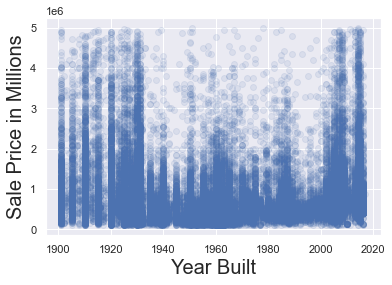

In [51]:
a = sns.regplot(x='YEAR BUILT', y='SALE PRICE', data=df[df['YEAR BUILT']>1900], fit_reg=False, scatter_kws={'alpha':0.1})
a.set_ylabel("Sale Price in Millions", fontsize = 20)
a.set_xlabel("Year Built", fontsize = 20)

IMPORTANT DISCOVERY: Properties build before 1940, and after 2000, are higher in price.

I also want to see the above graph with bubble size for gross square feet and land square feet...this can actually help us later IF/WHEN we want to select a specific property to recommend as a purchase for the investor based on it's size....we may be able to spot a 'cheap' property that is very large in size.....IF SO, right now is the time we want to explore this in our data set, before we make any additional changes....I'm going to store the current df's state as df_one...

In [52]:
len(df)

54579

In [53]:
df_one = df #captured clean at this point in time
len(df_one)
#you should be able to use df_one to export as csv, to observe the below in Tableau

54579

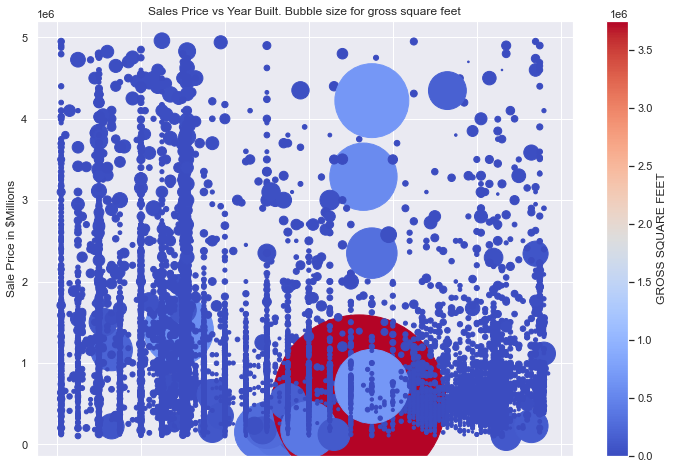

In [54]:
df[df['YEAR BUILT']>1900].plot.scatter(x='YEAR BUILT', y='SALE PRICE', c='GROSS SQUARE FEET', cmap='coolwarm',figsize=(12,8),s=df[df['YEAR BUILT']>1900]['GROSS SQUARE FEET']*.008)
plt.title('Sales Price vs Year Built. Bubble size for gross square feet')
plt.xlabel("Year Built")
plt.ylabel("Sale Price in $Millions")
plt.show()

We use c= to specify the color values
We use s= to specify the size of the bubbles. 
The chart generated shows a few larger bubbles, meaning those particular properties are larger in gross square feet.
The red bubble at the bottom is the largest property in terms of gross square feet.

okay...this is good....we have identified that there are properties that are large in terms of gross square feet (represented by bubble size) that are also in the 200,000 to 1M price range... further inspection analysis could drill in on the larger bubble sizes as larger properties in terms of gross square footage that are lower in price could present a potential purchase recomendation as an investment property....the existing data is saved as df_one....this can be exported as a csv so we can drill in further with Tableau....for now let's continue analysis here while we can still clean any remaining data...


 let's also look at this from the prospective of Land Square Feet....

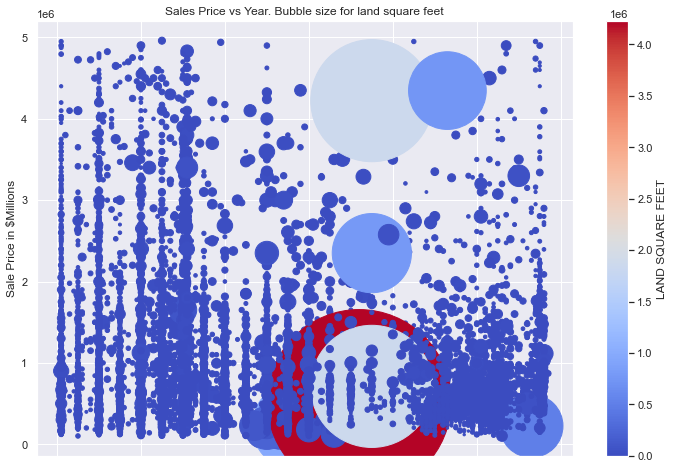

In [55]:
df[df['YEAR BUILT']>1900].plot.scatter(x='YEAR BUILT', y='SALE PRICE', c='LAND SQUARE FEET', cmap='coolwarm',figsize=(12,8),s=df[df['YEAR BUILT']>1900]['LAND SQUARE FEET']*.008)
plt.title('Sales Price vs Year. Bubble size for land square feet')
plt.xlabel("Year Built")
plt.ylabel("Sale Price in $Millions")
plt.show()

we see similar results comparativley with respect to Land Square feet....the large bubbles represent specific properties.

Now let's look at Prices over each NYC Borough

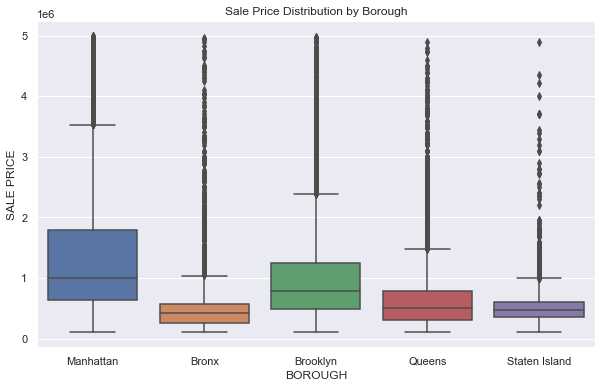

In [56]:
# Sales prices by borough
plt.figure(figsize=(10,6))
sns.boxplot(x='BOROUGH', y='SALE PRICE', data=df)
plt.title('Sale Price Distribution by Borough')
plt.show()

Most expensive properties are located in Manhattan with median sale price of almost exactly 1 million USD for a property. Relatively cheaper properties are in Bronx, Staten Island, and Queens, with Brooklyn being middle tier. In order to view the exact price, we'll need to use Plotly.

No huge surprises here though....it looks like we have cleaned our data well...

In order to have a more advanced view into our data, we can leverage the visualization features of Plotly. 

Up to this point we've cleaned our data and discovered a coorelation between the age of the property and it's price, specifically properties build before 1940, and after 2000, are higher in price.

we can also see the box plots across each NYC borough....now let's jump into visualizing more specific and advanced elements using plotly...

we are also going to take advantage of Plotly's timeseries analysis abilities 

In [139]:
#from datetime import date
#import plotly.offline as py

In [48]:
# let's install plotly and start using it's javascript like features
# I grabbed this install command from https://plotly.com/python/getting-started/
# conda install -c plotly plotly=5.4.0

Solving environment: ...working... done

## Package Plan ##

  environment location: C:\Users\samue\anaconda3

  added / updated specs:
    - plotly=5.4.0


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    conda-4.10.3               |   py38haa95532_0         2.9 MB
    plotly-5.4.0               |             py_0         6.8 MB  plotly
    tenacity-8.0.1             |   py38haa95532_0          39 KB
    ------------------------------------------------------------
                                           Total:         9.8 MB

The following NEW packages will be INSTALLED:

  plotly             plotly/noarch::plotly-5.4.0-py_0
  tenacity           pkgs/main/win-64::tenacity-8.0.1-py38haa95532_0

The following packages will be UPDATED:

  conda                               4.10.1-py38haa95532_1 --> 4.10.3-py38haa95532_0




plotly-5.4.0         | 6.8 MB    |            |   0% 
plotly-5.

we are up and running with Plotly now

....I've decided on an approach, what I want to do with the missing Gross Sq feet and Land Sq feet rows....since we already have conducted basic analysis on price and it's coorelation to age, and also price to gross Sq feet and Land Sq feet...I think we can drop the missing values..we have the existing df saved as df_one, if we need to revisit it. lets re inspect how many missing values we are dealing with....remember we already dropped rows with missing 'price' values...and many of those rows also had missing sq feet values...so lets re inspect how many missing values square footage values we have again....

In [57]:
#we'll make changes to df
len(df)

54579

<AxesSubplot:>

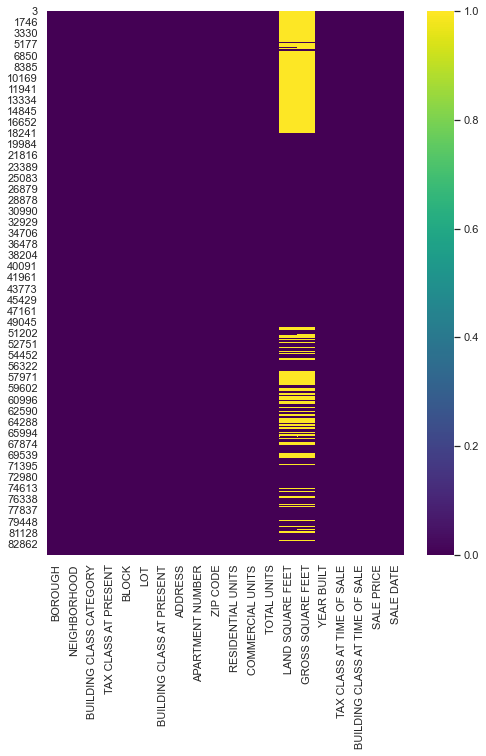

In [58]:
#let's revisit how many missing values we have now...
plt.figure(figsize=(8,10))
sns.heatmap(df.isnull(),cmap='viridis')

...hmmm...it looks like it's actually significant...let's see the actual numbers...another approach would be to replace the missing values with the average...we could do that later in a later iteration...for now let's see what the percentage of missing values are....

In [59]:
missing1 = df.isnull().sum()/len(df)*100

#if missing values exist, print the number and % it represents of its total
print(pd.DataFrame([missing1[missing1>0],pd.Series(df.isnull().sum()[df.isnull().sum()>1000])], index=['percent missing','total missing']))

                 LAND SQUARE FEET  GROSS SQUARE FEET
percent missing         35.671229          36.416937
total missing        19469.000000       19876.000000


wow...it's over one-third (35%) of our existing data set...let's keep these values for now...we want to do our exploratory analysis in Plotly on the Pricing data before removing those rows. ...for now...we are making some nice discovery specifically on PRICE, so I want to keep the 35% we have there for now.... we have found specific properties that are cheap yet large in square feet..so we should conduct gross square feet/land square feet analysis later when we are finished making other PRICE observations with the existing data..let's take advantage of Plotly now and look at distribution of price and also some time series aspects as well...

#now that Plotly is installed, let's import what we need from Plotly

In [144]:
# importing this at top of notebook now...
from datetime import date
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff

remember we made df['SALE DATE'] as dtype: datetime ....we may want to drill in on specific time elements...so let's make a year, month, quarter, day, weekend columns we could explore further....

In [60]:
df['SALE YEAR']    = df['SALE DATE'].dt.year
df['SALE MONTH']   = df['SALE DATE'].dt.month
df['SALE QUARTER'] = df['SALE DATE'].dt.quarter
df['SALE DAY']     = df['SALE DATE'].dt.day
df['SALE WEEKDAY'] = df['SALE DATE'].dt.weekday

let's obtain a Histogram for Sale Prices and Sales Prices after applying log...

I also want to view the 1.) Skewness of Sale Price, and 1.)Skewness of Sale Price after applying log...we'll use scipy.stats   skew   for that

In [61]:
from scipy.stats import skew 
trace1 = go.Histogram(
    x = df['SALE PRICE'],
    name = 'SALE PRICE'
)
dat = [trace1]
# Plot!
#py.iplot(dat, filename='Distplot with Normal Curve')

print("Skewness of Sale Price attribute is : {0}".format(skew(df['SALE PRICE'])))

trace2 = go.Histogram(
    x = np.log(df['SALE PRICE']), 
    name = 'log(SALE PRICE)'
)
dat = [trace1]
# Plot!
#py.iplot(dat, filename='Distplot with Normal Curve')
print("Skewness of Sale Price attribute after applying log is : {0}".format(skew(np.log(df['SALE PRICE']))))

fig = tls.make_subplots(rows=2, cols=1, subplot_titles=('Sale Prices', 'Sale Prices after applying log'));
fig.append_trace(trace1, 1, 1);
fig.append_trace(trace2, 2, 1);
fig['layout'].update(height=600, width=800,title='Histogram Plot for Sale Prices of Properties');
py.iplot(fig, filename='simple-subplot')


Skewness of Sale Price attribute is : 2.3439984488874255
Skewness of Sale Price attribute after applying log is : 0.19898915141502985


this zoom in with Plotly allows additional features unavailable in matplot lib and seaborn...we can actually hover over the visual with our mouse to display the values on the graphics, similar to what we can do in Tableau...however we can do some of it right here in the Jupyter Notebook...

(the zoom in on the logarithm (red) showing the power to which something must be raised shows that not all 'jump' or 'declines' are equal...observe the spike just at 1M and the fall off after 1M...with the matching observation in the histogram...)a hypothesis is that serveral properties are sold at 980k-990k because it is a key phycological price ..."it's not over 1M....."..further supporting evidence needs to be referenced, perhaps an article published on NYC property pricing just under 1M....

after further investigation, it was discovered that
* The mansion tax kicks in when you purchase a unit in NYC for 1 million or more
* [NYC Mansion Tax](https://www.propertynest.com/blog/sales/what-mansion-transfer-tax-new-york/)

Let's take advantage of Plotly's ability to make donut and bar graphs...this will be helpful to visualize our 1.)  Percentage of Properties in each Borough and 2.)Number of properties in each Borough

In [62]:
boroughs = ['Manhattan','Bronx','Brooklyn','Queens','Staten Island']
property_count = []
for b in boroughs:
    property_count.append(len(df.BOROUGH[df.BOROUGH == b]))

fig = {
  "data": [
    {
      "values": property_count,
      "labels": boroughs,
      "hoverinfo":"label+percent",
      "hole": .3,
      "type": "pie"
    }],
  "layout": {
        "title":"Percentage of Properties in Boroughs",
    }
}
py.iplot(fig, filename='donut')


dataa = [go.Bar(
            y= boroughs,
            x = property_count,
            width = 0.7,
            opacity=0.6, 
            orientation = 'h',
            marker=dict(
                color='rgb(158,202,225)',
                line=dict(
                    color='rgb(8,48,107)',
                    width=1.5,
                )
            ),
        )]
layout = go.Layout(
    title='Number of Properties in each Bourough',
    autosize = False,
    width=800,
    height=500,
    margin=go.Margin(
        l=250,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
)

fig = go.Figure(data=dataa, layout = layout)
py.iplot(fig, filename='barplottype')

C:\Users\samue\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:405: DeprecationWarning:

plotly.graph_objs.Margin is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.layout.Margin




Next, we will preform sanity check with Plotly against our matplotlib graph…Sale Prices in each Borough…let's see if the data checks out in a Plotly graph as well...

In [63]:
trace0 = go.Box(
    y=df['SALE PRICE'][df.BOROUGH == 'Manhattan' ],
    name = 'Manhattan',
    marker = dict(
        color = 'rgb(12, 12, 140)',
    )
)
trace1 = go.Box(
    y=df['SALE PRICE'][df.BOROUGH ==  'Bronx' ],
    name = 'Bronx',
    marker = dict(
        color = 'rgb(8,81,156)',
    )
)
trace2 = go.Box(
    y=df['SALE PRICE'][df.BOROUGH ==  'Brooklyn' ],
    name = 'Brooklyn',
    marker = dict(
        color = 'rgb(12, 12, 140)',
    )
)
trace3 = go.Box(
    y=df['SALE PRICE'][df.BOROUGH ==  'Queens' ],
    name = 'Queens',
    marker = dict(
        color = 'rgb(12, 128, 128)',
    )
)
trace4 = go.Box(
    y=df['SALE PRICE'][df.BOROUGH ==  'Staten Island' ],
    name = 'Staten Island',
    marker = dict(
        color = 'rgb(12, 12, 140)',
    )
)

dat = [trace0, trace1, trace2, trace3, trace4]
layout = go.Layout(
    title='Housing Prices in Boroughs',
    xaxis=dict(
        title='Borough'
    ),
    yaxis=dict(
        title='Sale Price'
    ),
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)'
)

fig = go.Figure(data=dat, layout=layout)
py.iplot(fig)

This looks good. This definietley passes a sanity check when comparing to the matplot lib graph. Plotly is working out rather nicely with this data set...by hovering over the graphics, we can observe descriptive statistics that are unavailable in a standard Matplotlib / Seaborn graphics.

additional exploratory inforation in the Ploty graph (min/max, interquartile ranges, exact median points, exact price of specific outliers, etc)..

# Median Property Price
* Manhattan : 999K
* Brooklyn : 778k
* Queens : 509k
* Staten Island :474k
* Bronx : 420k

Let's take advantage of some more of Plotly's more advanced features to analyze the data.

let's take a look at sales prices in each month...#need ind to run code

In [64]:
# Rainbow plot
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
colors = ['hsl('+str(h)+',50%'+',50%)' for h in np.linspace(0, 360, 12)]
data = [{
    'y' : df['SALE PRICE'][df['SALE MONTH'] == ind],
    'type':'box',
    'name' : months[ind - 1],
    'marker':{'color': colors[ind - 1]}
} for ind in range(1,13)]

layout = go.Layout(
    title='Property Prices in each Month',
    xaxis=dict(
        title='Month'
    ),
    yaxis=dict(
        title='Sale Price'
    ),
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)'
)

fig = go.Figure(data=data, layout=layout)
#dat = [trace0, trace1, trace2, trace3, trace4]
py.iplot(fig)

the month over month data is rather flat...the highest median is in Aug at 700k..
...May - Aug summer season has a higher median than other seasons...

Ploty allows us to see the number of properties sold in each borough in each month...

In [65]:
df['sp'] = df['SALE PRICE']
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

p = pd.DataFrame(df.groupby(['BOROUGH', 'SALE MONTH']).sp.count()).reset_index()
colors = ['hsl('+str(h)+',50%'+',50%)' for h in np.linspace(0, 360, 12)]

data = [
    {
        'x': months,
        'y': [boroughs[ind]] * 12,
        'showlegend' : False,
        'mode': 'markers',
        'text': [ x for x in p.sp[p.BOROUGH == ind]],
        'marker': {
            'color': colors,
            'size': [(x/np.sum(p.sp[p.BOROUGH == boroughs[ind]])*400) for x in p.sp[p.BOROUGH == boroughs[ind]]],
        }
    } for ind in range(5)
]

layout = go.Layout(
    title='Number of properties sold in each borough in each month',
    xaxis=dict(
        title='Month',
        gridcolor='rgb(255, 255, 255)',
    ),
    yaxis=dict(
        title='Borough',
        gridcolor='rgb(255, 255, 255)',
    ),
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
)

fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='temp')

In [ ]:
EDIT STOP POINT ON DEC 8

let's take a look at the the building class category...I want to visualize what class to the majority of property sales belong to?

In [66]:
from collections import Counter
# print(Counter(df['BUILDING CLASS CATEGORY']))
c = dict(Counter(df['BUILDING CLASS CATEGORY']))
import operator
sorted_category = sorted(c.items(), key=operator.itemgetter(1))
cat_name  = []
cat_value = []
for tup in sorted_category:
    cat_name.append(tup[0])
    cat_value.append(tup[1])

In [67]:
build_data = [go.Bar(
            y= cat_name,
            x = cat_value,
            width = 0.7,
            opacity=0.6, 
            orientation = 'h',
            marker=dict(
                color='rgb(158,202,225)',
                line=dict(
                    color='rgb(8,48,107)',
                    width=1.5,
                )
            ),
        )]
layout = go.Layout(
    title='What building class do majority of apartments belong to?',
    autosize = False,
    width=800,
    height=800,
    margin=go.Margin(
        l=350,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
    xaxis=dict(
        title='Number of Properties',
    ),
    yaxis=dict(
        title='Building Class',
    ),
)

fig = go.Figure(data=build_data, layout = layout)
py.iplot(fig, filename='barplottype')

C:\Users\samue\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:405: DeprecationWarning:

plotly.graph_objs.Margin is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.layout.Margin




The majority of our Properties in this data set are reseidential, non-commercial

before I remove 33% of the data to do analysis on gross square feet/land square feet, I want to observe the price distribution across the top 20 most common neighborhoods in this data set...we will work to curtail our end recommendation to investors around the most commonly found neighborhoods in the data set...the higher frequency of occurance of these neighbordhoods gives me more confidence in making a data driven decsision...

In [68]:
from collections import Counter
neighborhoods = list(dict(Counter(df['NEIGHBORHOOD']).most_common(20)).keys())

avg_sale_prices = []
for i in neighborhoods:
    avg_price = np.mean(df['SALE PRICE'][df['NEIGHBORHOOD'] == i])
    avg_sale_prices.append(avg_price)
    
n_data = [go.Bar(
            y= neighborhoods,
            x = avg_sale_prices,
            width = 0.7,
            opacity=0.6, 
            orientation = 'h',
            marker=dict(
                color='rgb(158,202,225)',
                line=dict(
                    color='rgb(8,48,107)',
                    width=1.5,
                )
            ),
        )]
layout = go.Layout(
    title='Average Property Price in the Top 20 Neighborhoods',
    autosize = True,
    margin=go.Margin(
        l=250,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
    xaxis=dict(
        title='Sale Price',
    ),
    yaxis=dict(
        title='Neighborhood',
    ),
)

fig = go.Figure(data=n_data, layout = layout)
py.iplot(fig, filename='barplottype')

Neighborhood Selection Reference: 
[NYC Property Advisory](https://www.propertynest.com/blog/sales/how-buy-investment-property/)

"Where Should You Buy an Investment Property in NYC?
experts recommend the “tried and true” neighborhoods.

In other words, neighborhoods like the **West Village** or the **Upper West Side** that are iconic and not going out of style any time soon.

There will pretty much always be people looking to live in these high-brow neighborhoods, especially because they’re close to universities.

In short: these come with less risk. You know what you’re signing up for.

Up and coming or fast-growing neighborhoods like **Crown Heights or Inwood** tend to provide higher cap rates and appreciation potential, whereas the celebrated classics provide downside/volatility protection."

"How to identify emerging areas?
Look for an increased investment in architecture, expanded transit options (i.e. the new Q line) or new schools.

You’ve probably seen the huge sleek modern buildings that dominate **Williamsburg** and are now creeping as far south as **Flatbush**.

Check the Days on Market (DOM) for listings on StreetEasy or Zillow. If the DOM is declining, that’s good.

You ideally want to choose a neighborhood where most homes are being scooped up after just a few days on the market. This means there’s lots of demand.

Word of mouth, though less certifiable, can also be a good way to identify up-and-coming areas.

Areas of **North Manhattan**, South Brooklyn and Western Queens are getting increasingly more attention as a result of their convenient access to public transportation and low prices relative to other parts of the city.

You might also look for neighborhoods that are set to receive an onslaught of new buildings.

**Northwest Chelsea**, for instance, is slated to get an increase in supply because of new developments."

We'll look at Neighborhood selection more in Tableau

Chelsea and the Upper West Side are the most expensive Neighborhoods. Riverdale and Great Kills are the cheapest...Flushing-North and Bay Ridge are in the middle...

defining land square feet and gross square feet.
land square feet can be thought of 'how much land is surrounding the property'
gross square feet can be though of as 'total area of all floors, even if they are in the sky..such as in a skyscraper'

this is why Manhattan has the highest gross square feet...in Manhattan you are paying for property that is listed in the sky...thus the term 'sky scraper'

we will now move into our analysis of gross square feet and land square feet...remember the misssing values are over 30%...so I want to save the dataframe in it's current state before I preform further operations...

In [69]:
df_7a_state = df

looking at null values again...

<AxesSubplot:>

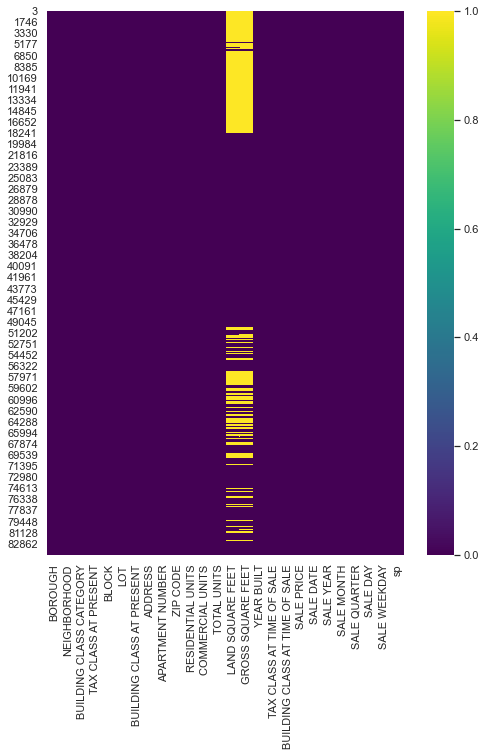

In [70]:
plt.figure(figsize=(8,10))
sns.heatmap(df.isnull(),cmap='viridis')

visualizing percentage again

In [71]:
missing = df.isnull().sum()/len(df)*100

#if missing values exist, print the number and % it represents of its total
print(pd.DataFrame([missing[missing>0],pd.Series(df.isnull().sum()[df.isnull().sum()>1000])], index=['percent missing','total missing']))

                 LAND SQUARE FEET  GROSS SQUARE FEET
percent missing         35.671229          36.416937
total missing        19469.000000       19876.000000


In [72]:
len(df)

54579

54,579 rows before dropping missing values for land sq feet and gross sq feet

In [73]:
# let us check for outliers 
df[['LAND SQUARE FEET','GROSS SQUARE FEET']].describe()

,LAND SQUARE FEET,GROSS SQUARE FEET
count,3.511000e+04,3.470300e+04
mean,2.875265e+03,2.073094e+03
std,2.817544e+04,2.212212e+04
min,0.000000e+00,0.000000e+00
25%,1.400000e+03,8.725000e+02
50%,2.200000e+03,1.520000e+03
75%,3.194000e+03,2.250000e+03
max,4.228300e+06,3.750565e+06


There are outliers in the lower and upper bound of the columns. We could set an upper bound of 75% for our dataset as maximum, since 75th percentile of the dataset may represents a good cutoff for majority of houses' square feet metrics....not sure if I want to do that yet, but recording my thoughts

now we are going to drop those missing values...we may also only want to keep properties w/fewer than 20,000 sq feet, or 2,000 square meters...
reference property Tycoon in New York..

In [74]:
# Removes all NULL values
# we'll call it df_sq_clean
df_sq = df[df['LAND SQUARE FEET'].notnull()] 
df_sq_clean = df_sq[df_sq['GROSS SQUARE FEET'].notnull()]

In [75]:
len(df_sq_clean)

34702

looks correct, we removed 20k rows...

now let's do some analysis with df_sq_clean before we do anything else

In [76]:
df_sq_clean.describe()

,BLOCK,LOT,ZIP CODE,RESIDENTIAL UNITS,COMMERCIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,SALE PRICE,SALE YEAR,SALE MONTH,SALE QUARTER,SALE DAY,SALE WEEKDAY,sp
count,34702.000000,34702.000000,34702.000000,34702.000000,34702.000000,34702.000000,3.470200e+04,3.470200e+04,34702.000000,3.470200e+04,34702.000000,34702.000000,34702.000000,34702.000000,34702.000000,3.470200e+04
mean,5256.461184,225.361708,10966.167454,1.721860,0.156446,1.880439,2.829378e+03,2.072324e+03,1856.370382,7.958546e+05,2016.655438,6.568065,2.501614,16.571235,2.140856,7.958546e+05
std,3632.627633,476.551691,974.267934,11.360757,12.186953,16.728840,2.822672e+04,2.212197e+04,410.264002,6.532387e+05,0.475232,3.449357,1.116114,8.828513,1.389209,6.532387e+05
min,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,1.007000e+05,2016.000000,1.000000,1.000000,1.000000,0.000000,1.007000e+05
25%,2336.250000,21.000000,10469.000000,1.000000,0.000000,1.000000,1.358000e+03,8.722500e+02,1920.000000,4.157465e+05,2016.000000,4.000000,2.000000,9.000000,1.000000,4.157465e+05
50%,4836.000000,45.000000,11219.000000,1.000000,0.000000,1.000000,2.190000e+03,1.520000e+03,1935.000000,6.150000e+05,2017.000000,6.000000,2.000000,17.000000,2.000000,6.150000e+05
75%,7360.000000,96.000000,11361.000000,2.000000,0.000000,2.000000,3.139750e+03,2.250000e+03,1963.000000,9.300000e+05,2017.000000,10.000000,4.000000,24.000000,3.000000,9.300000e+05
max,16319.000000,7501.000000,11694.000000,1844.000000,2261.000000,2261.000000,4.228300e+06,3.750565e+06,2017.000000,4.986410e+06,2017.000000,12.000000,4.000000,31.000000,6.000000,4.986410e+06


...there are properties that have 0 square feet...which shouldn't be possible unless the property does not exist...the 0 values need to be dealt with...

...let's use some of the same graphics we used to observe sale price, but now to look at LAND SQUARE FEET and GROSS SQUARE FEET...we need to clean these of 0 values and any significant outliers....

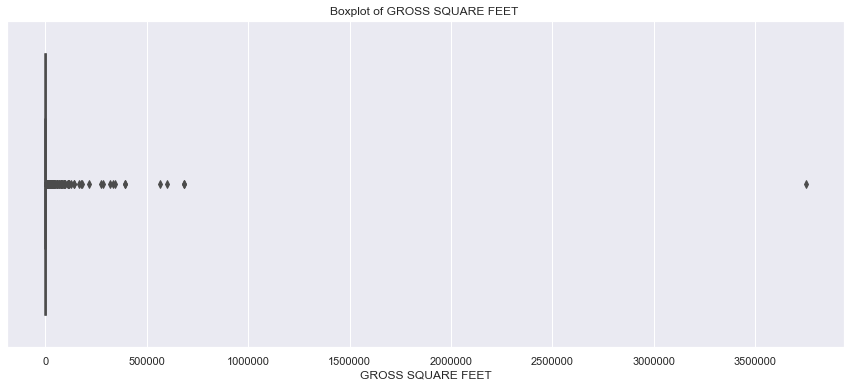

In [77]:
#Set the size of the plot
plt.figure(figsize=(15,6))

# Plot the data and configure the settings
sns.boxplot(x='GROSS SQUARE FEET', data=df_sq_clean)
plt.ticklabel_format(style='plain', axis='x')
plt.title('Boxplot of GROSS SQUARE FEET ')
plt.show()

...there is one high outlier...above 3.5M...that may be attributed to an entire building sale, but we can't say conclusively...also three above 500k...

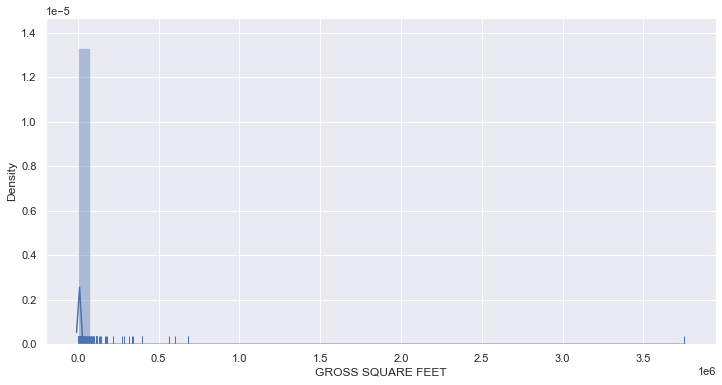

In [78]:
plt.figure(figsize=(12,6))
sns.distplot(df_sq_clean['GROSS SQUARE FEET'], kde=True, bins=50, rug=True)
plt.show()

...this looks similar to what we saw with the price data before, just not quite as pronounced...let's use the same code we used on the pricing data to zoom in on GROSS SQUARE FEET...

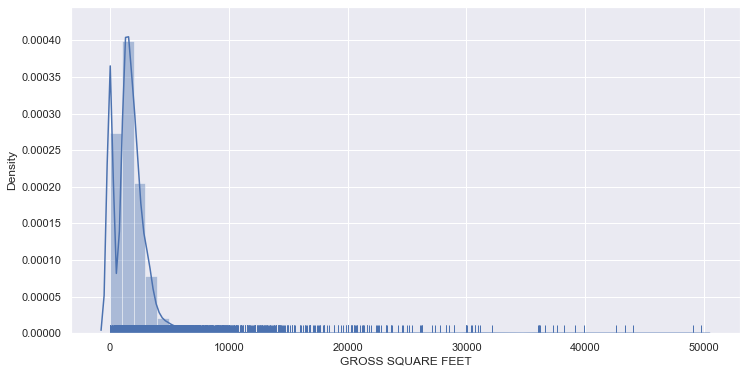

In [79]:
df5gr= df_sq_clean[(df_sq_clean['GROSS SQUARE FEET']<50000)]
plt.figure(figsize=(12,6))
sns.distplot(df5gr['GROSS SQUARE FEET'], kde=True, bins=50, rug=True)
plt.show()

...looks like the majority are under 10k, however many that are actually zero itself...

let's try to visualize this another way....we really need to rely on python visualization at this point to drill in on GROSS SQUARE FEET...


...let's view GROSS SQUARE FEET with SALE PRICE in a scatter plot..

SOMETIMES YOU HAVE TO VIEW IT A COUPLE DIFFERENT WAYS TO FINALLY SEE WHAT'S GOING ON

## PRIME STAGE
remove anyting over 20,000 sq feet

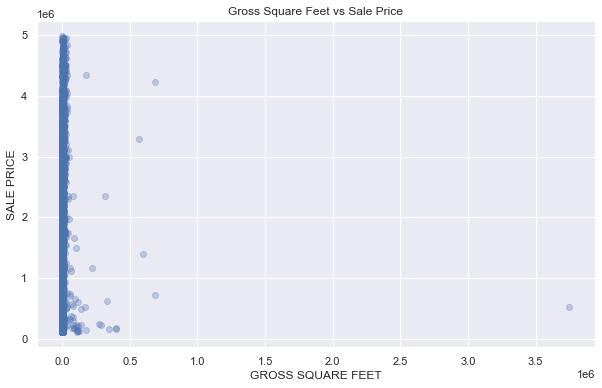

In [80]:
#scatter plot of gross square feet and sale price
plt.figure(figsize=(10,6))
sns.regplot(x='GROSS SQUARE FEET', y='SALE PRICE', data=df_sq_clean, fit_reg=False, scatter_kws={'alpha':0.3})
plt.title('Gross Square Feet vs Sale Price')
plt.show()

...at this point let's remove anyting over 20,000 sq feet(reference)...that is an outlier...

In [81]:
# Keeps properties with fewer than 20,000 Square Feet, which is about 2,000 Square Metres
df_sq_clean2 = df_sq_clean[df_sq_clean['GROSS SQUARE FEET'] < 20000]
df_sq_clean2 = df_sq_clean2[df_sq_clean2['LAND SQUARE FEET'] < 20000]

In [82]:
len(df_sq_clean2)

34519

In [153]:
df_sq_clean2.to_csv('nyc_clean1.csv')

from 34,702 to now 34,519, we dropped about 200 high leverage outliers...lets re-run the scatter plot now...

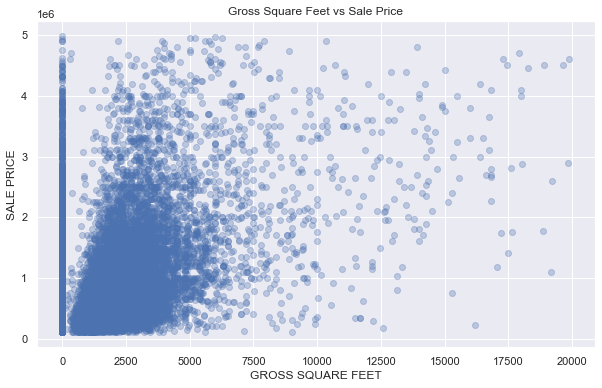

In [83]:
#scatter plot of gross square feet and sale price
plt.figure(figsize=(10,6))
sns.regplot(x='GROSS SQUARE FEET', y='SALE PRICE', data=df_sq_clean2, fit_reg=False, scatter_kws={'alpha':0.3})
plt.title('Gross Square Feet vs Sale Price')
plt.show()

...perfect...now we can actually see how GROSS SQUARE FEET is related to the price....there are several zero values...however Ploty will adjust for this and still give use a clean average when we get to the point of building the bubble graphs....

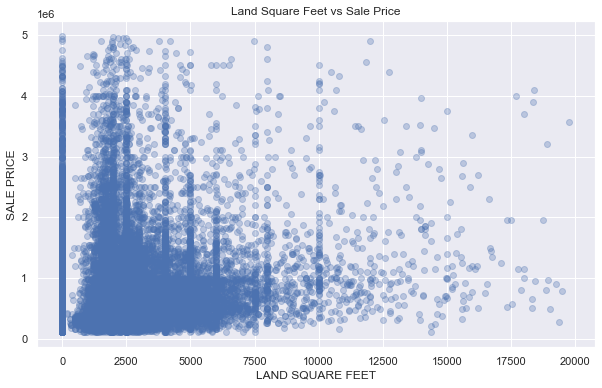

In [84]:
#scatter plot of land square feet and sale price
plt.figure(figsize=(10,6))
sns.regplot(x='LAND SQUARE FEET', y='SALE PRICE', data=df_sq_clean2, fit_reg=False, scatter_kws={'alpha':0.3})
plt.title('Land Square Feet vs Sale Price')
plt.show()

...hmmm...the relationship between gross square feet 'looks' to be more linear than land square feet from a quick observation....lets build a corrlation matrix to see if this is the case....

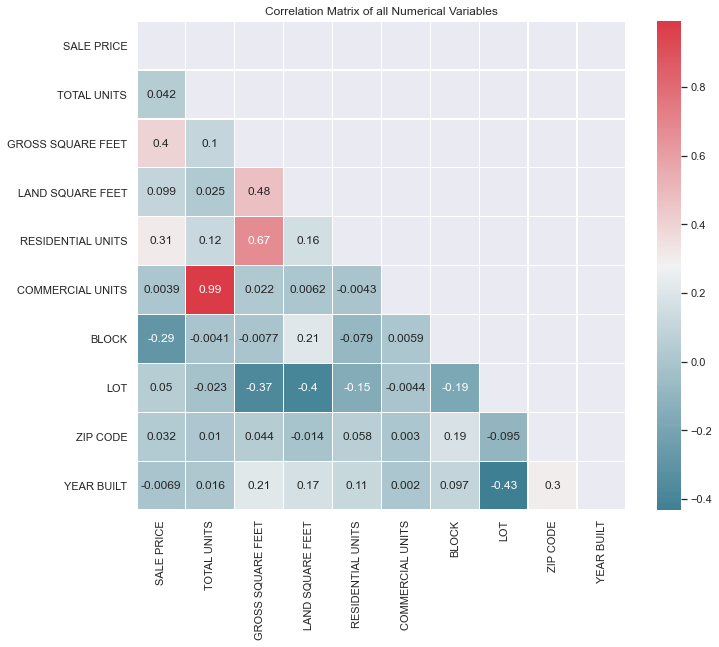

In [85]:
# Compute the correlation matrix
d= df_sq_clean2[['SALE PRICE', 'TOTAL UNITS','GROSS SQUARE FEET',  'LAND SQUARE FEET', 'RESIDENTIAL UNITS', 
         'COMMERCIAL UNITS', 'BOROUGH', 'BLOCK', 'LOT', 'ZIP CODE', 'YEAR BUILT',]]
corr = d.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, 
            square=True, linewidths=.5, annot=True, cmap=cmap)
plt.yticks(rotation=0)
plt.title('Correlation Matrix of all Numerical Variables')
plt.show()

gross square feet has the highest coorelation to sales price, of any other variable, with the P value of 0.4....THUS THE MOST LINEAR RELATIONSHIP...

I feel comfortable that we can give gross square feet more wieght in terms of impact towards pricing (than land square feet ) at this point...

Another data analysis subset within this project could include further exploring Residential Units with the P value of 0.31. a hypothesis from the following article is that the more gross square feet available, the more number of rooms are available...
[NYC Property Investment Advisory](https://www.propertynest.com/blog/sales/how-buy-investment-property/)Quote:"Remember: rent in NYC is determined by number of bedrooms, not the size of bedrooms!"

* the hypothesis submitted from this coorelations is simply that the more gross square feet that is avialable (P value of 0.4) the more **Number of Bedrooms** an investment property can hold. More analysis can be conducted on the relationship between: Gross Square Feet, Residential Units, Number of Rooms Available.

In [86]:
# average LAND SQUARE FEET in each borough box plot
d3 = pd.DataFrame(df_sq_clean2.groupby(['BOROUGH']).mean()).reset_index()
d3['BOROUGH'][d3['BOROUGH'] == 1] = 'Manhattan'
d3['BOROUGH'][d3['BOROUGH'] == 2] = 'Bronx'
d3['BOROUGH'][d3['BOROUGH'] == 3] = 'Brooklyn'
d3['BOROUGH'][d3['BOROUGH'] == 4] = 'Queens'
d3['BOROUGH'][d3['BOROUGH'] == 5] = 'Staten Island'
total = d3['LAND SQUARE FEET'].sum()
trace0 = go.Scatter(
    x=d3['BOROUGH'],
    y=d3['LAND SQUARE FEET'],
    mode='markers',
    marker=dict(
        size=[((x/total)*300) for x in d3['LAND SQUARE FEET']],
        color=['rgb(93, 164, 214)', 'rgb(255, 144, 14)',  'rgb(44, 160, 101)', 'rgb(255, 65, 54)', 'rgb(255, 15, 54)'],
    )
)

data = [trace0]
layout = go.Layout(
    title='Average Land square feet of properties in each Borough',
    xaxis=dict(
        title='Borough',
        gridcolor='rgb(255, 255, 255)',
    ),
    yaxis=dict(
        title='Land square feet',
        gridcolor='rgb(255, 255, 255)',
    ),
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)'
)

fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='bubblechart-size')

there is more open land space in Staten Isalnd and Queens...that means the price is likely cheaper for having more space....as we look to gross square feet (sky scraper space) the price goes up...

In [87]:
# average GROSS SQUARE FEET in each borough box plot
total = d3['GROSS SQUARE FEET'].sum()
trace0 = go.Scatter(
    x=d3['BOROUGH'],
    y=d3['GROSS SQUARE FEET'],
    mode='markers',
    marker=dict(
        size=[((x/total)*300) for x in d3['GROSS SQUARE FEET']],
        color=['rgb(93, 164, 214)', 'rgb(255, 144, 14)',  'rgb(44, 160, 101)', 'rgb(255, 65, 54)', 'rgb(255, 15, 54)'],
    )
)

layout = go.Layout(
    title='Average Gross square feet in each Borough',
    xaxis=dict(
        title='Boroughs',
    ),
    yaxis=dict(
        title='Average gross square feet',
    ),
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
)


data = [trace0]
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='gross-square-feet-borough-bubble-chart')

...Manhattan is clearly the king of the sky...the most gross square feet because additional gross square footage is located in the sky...in skyscrapers...

## Gross Square Feet Definition from the documentaion:

Gross Square Feet:
The total area of all the floors of a building as measured from the exterior surfaces of the
outside walls of the building, including the land area and space within any building or structure
on the property. 

to finish the analysis stage, next I plan to :

* 1.) build an exported csv file of the data before we dropped rows containing NA values for gross square feet and land square feet. this can be located in pandas dataframe df_7a_state OR df
* **2.)** **view the **csv data in Tableau** to find i.property **in manhatann built before 1940 OR after 2000 that is in the 4,700+ gross square feet range.** these are prime properties. **(if we find something matching this criteria under the median $990k, we could consider this an investment w/ good ROI)??** because age b4 1940 or after 2000 is generally more expensive...and 990k is the median...this is my logic..
* 3.) **observe the pricing in Tableau of properties that fit those categories**
* 4.)from there, **recommend 1-5 top properties in Manhattan** to purchase based on i.)age ii.)gross square feet iii.)location in manhattan iv.)if identified in one of the top 20 neighborhoods, this is an extra value add, but it is not required... 
* 5.) observe the lowest priced properties containing a significant amount of gross square feet...are there any significantly good property deals we can discovery in Manhatten from this data set?

**7.) assess top 20 Neighborhoods on Manhattan: Chelsea, Upper West Side, etc.**

what would happen if we removed all 0 values...would that change the average output we see in Plotly? let's see...

In [88]:
len(df_sq_clean2[df_sq_clean2['GROSS SQUARE FEET'] > 0])

26567

from 34,519 to 26,567

In [67]:
 34519 - 26567

7952

we loose 8k rows...

out of curisoity, I want to see how the above 3 charts are changed by dropping all zero values....

In [122]:
df_sq_clean3 = df_sq_clean2[df_sq_clean2['GROSS SQUARE FEET'] > 0]

In [124]:
len(df_sq_clean3)

26567

..,.the graphical sanity check was preformed and it was discovered that Plotly already took care of the 8k zero values....the graph is accurate with the data cleaned to the degree that it is...you do no need to remove the zero values in gross square feet or land square feet....